# PW5
# Blurring and Smoothing

There are a lot of different effects and filters we can apply to images. We're just going to go through a few of them here. Most of them involve some sort of math based function being applied to all the pixels values.


-----
#### Info Link on Blurring Math:

http://people.csail.mit.edu/sparis/bf_course/

------

## Convenience Functions

Quick function for loading the puppy image.

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
# simple function to read bricks image
def load_img():
    img = cv2.imread('bricks.jpg').astype(np.float32) / 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [ ]:
# simple function to plot img
def display_img(img):
    fig = plt.figure(figsize=(7,6))
    ax = fig.add_subplot(111)
    ax.imshow(img)

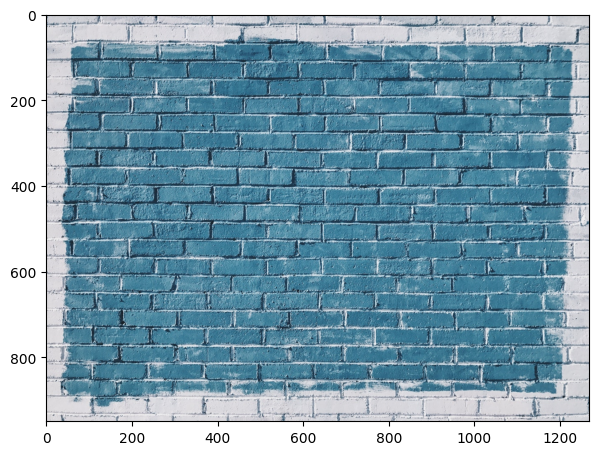

In [ ]:
# load and plot the image using load_img() and display_img(i)
i = load_img()
display_img(i)

-------

### Gamma Correction : Practical Effect of Increasing Brightness

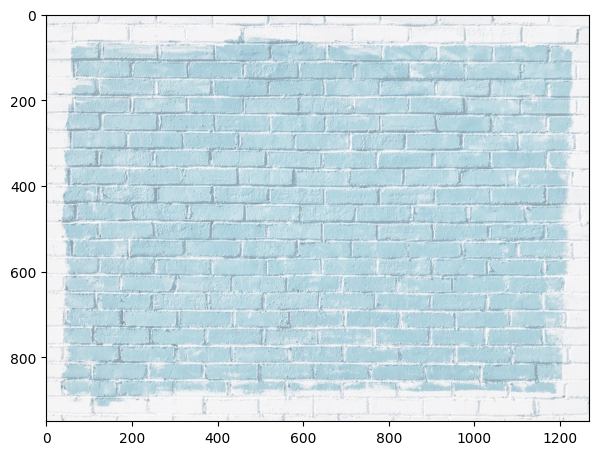

In [ ]:
img = load_img()
gamma = 1/4
# use power function from numpy library that takes img and gamma variables
effected_image = np.power(img,gamma)
display_img(effected_image)

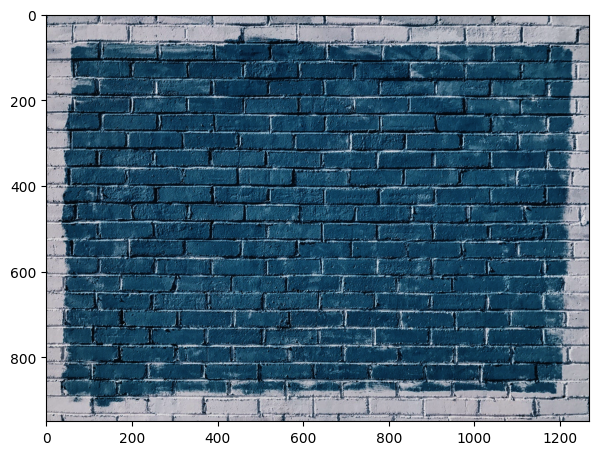

In [ ]:
img = load_img()
gamma = 2
# use power function from numpy library that takes img and gamma variables
effected_image = np.power(img,gamma)
display_img(effected_image)

### Low Pass Filter with a 2D Convolution

A fitlering operation known as 2D convolution can be used to create a low-pass filter. Make sure to view the video for an explanation of what's happening in the code below.

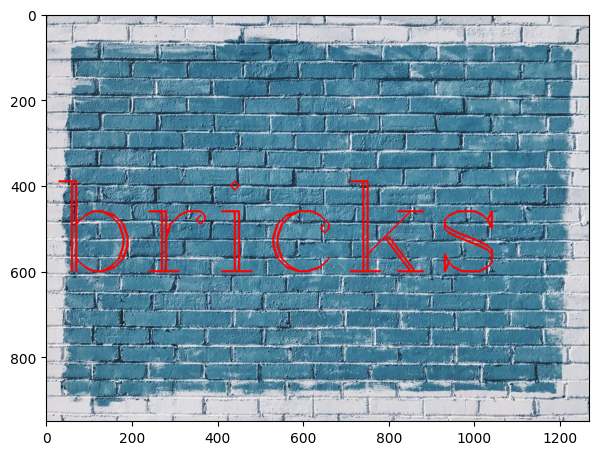

In [ ]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
# Use putText function to add 'bricks' word on the image with the position (10,600) and color=(255,0,0)
img=cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=3)
display_img(img)

### Create the Kernel

In [ ]:
# Create a kernel 5X5, Use ones function and divide all values by 25
kernel = np.ones((5,5))/25

In [ ]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]])

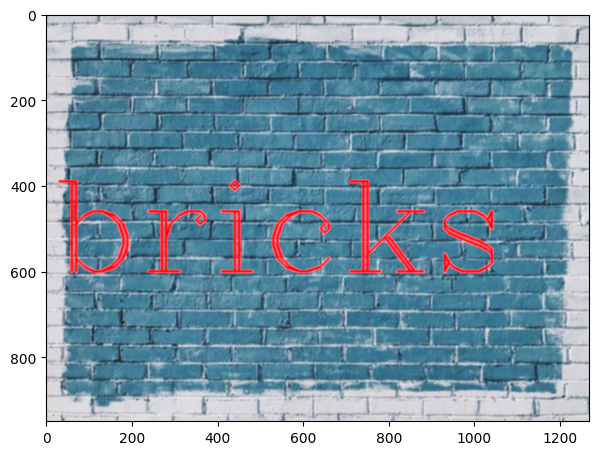

In [ ]:
# Apply filter2D function that takes img and kernel inpute in order to apply 2D Convolution
dst = cv2.filter2D(img,-1,kernel)# -1 for the same depth as the input
display_img(dst)

## Averaging

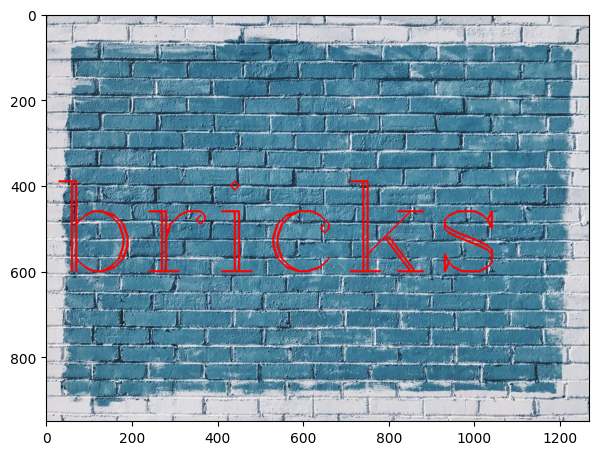

In [ ]:
# Read the original image again
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
# Use putText function to add 'bricks' word again to the image
img = cv2.putText(img, text='bricks', org=(10, 600), fontFace=font, fontScale=10, color=(255, 0, 0), thickness=3)
display_img(img)


In [ ]:
# Use blur function with a mask 5x5 in order to blur the image
blurred_img = cv2.blur(img,(1,1))

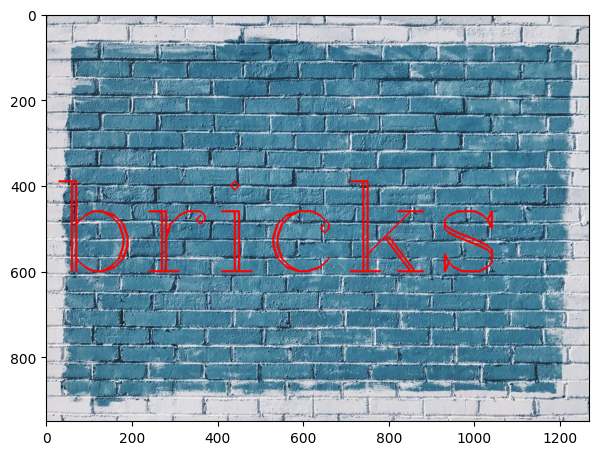

In [ ]:
display_img(blurred_img)

## Gaussian Blurring

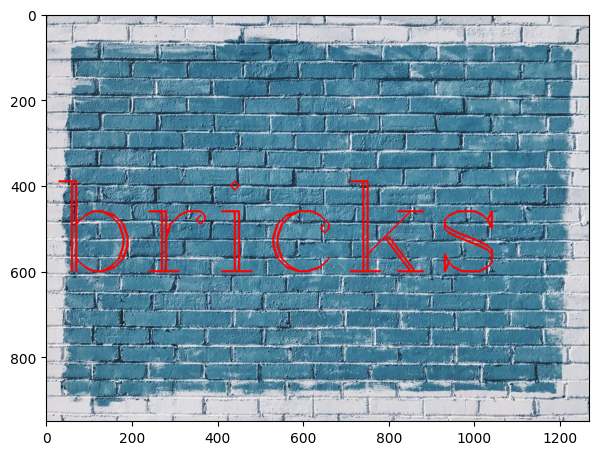

In [ ]:
# Read the original image again
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

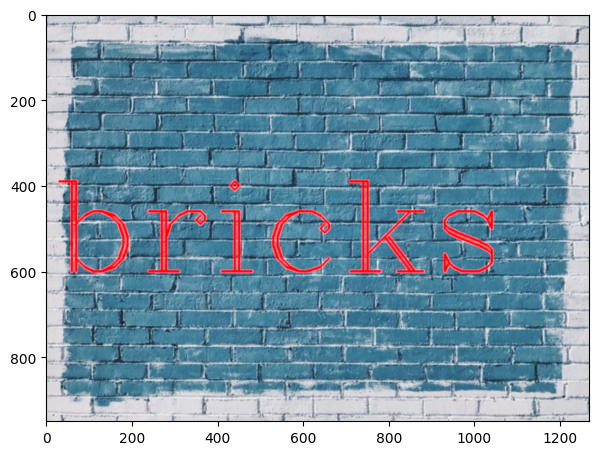

In [ ]:
# Use GaussianBlur function mask 5x5 in order to apply gaussian blur on the image
blurred_img = cv2.GaussianBlur(img,(5,5),0)
display_img(blurred_img)

## Median Blurring

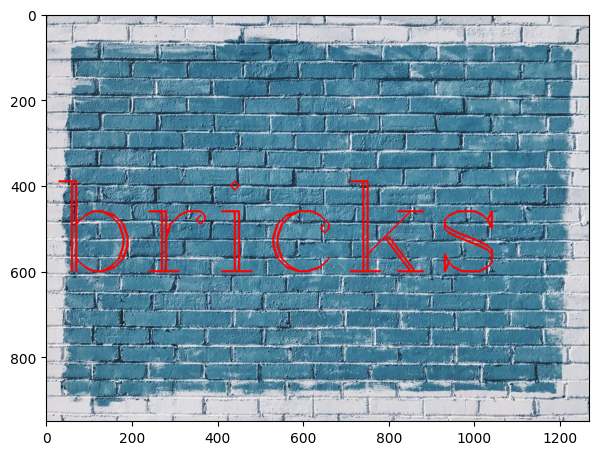

In [ ]:
# Read the original image again
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

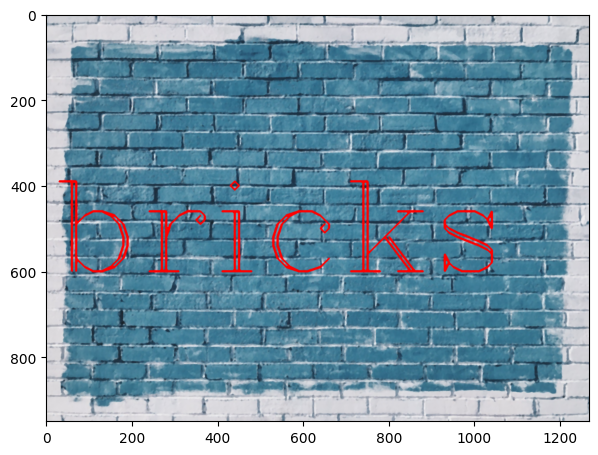

In [ ]:
# Apply medianBlur function on the image
median = cv2.medianBlur(img,5)
display_img(median)

----------
### Adding Noise

Let's see a more useful case of Median Blurring by adding some random noise to an image.

In [ ]:
# Read sammy.jpg image
# Correct colors distribution
img = cv2.imread('sammy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [ ]:
img.max()

255

In [ ]:
img.min()

0

In [ ]:
img.mean()

89.33240744375256

In [ ]:
img.shape

(1367, 1025, 3)

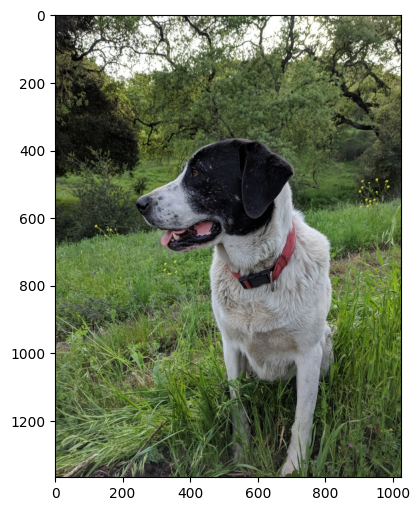

In [ ]:
display_img(img)

In [ ]:
# Read the noised image: sammy_noise.jpg
noise_img = cv2.imread('sammy_noise.jpg')

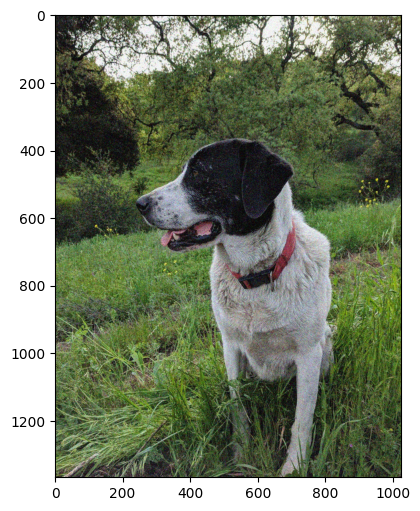

In [ ]:
display_img(noise_img)

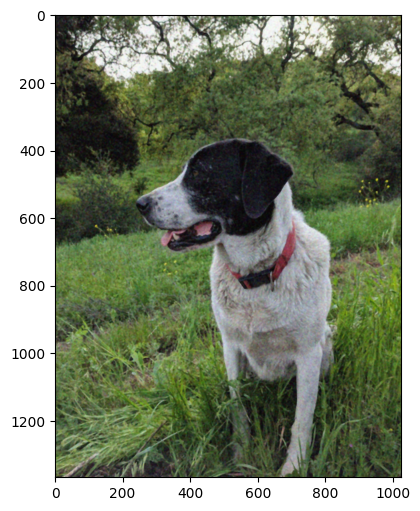

In [ ]:
# Apply the medianBlur function on the noise_img in order to filter it
median = cv2.medianBlur(noise_img,5)
display_img(median)

--------

## Bilateral Filtering

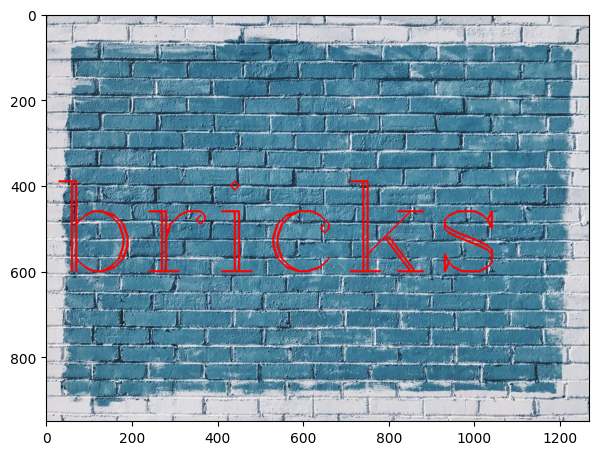

In [ ]:
# Read the original image again
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

In [ ]:
# Apply bilateralFilter function with the following input (img,9,75,75)
blur = cv2.bilateralFilter(img,9,75,75)

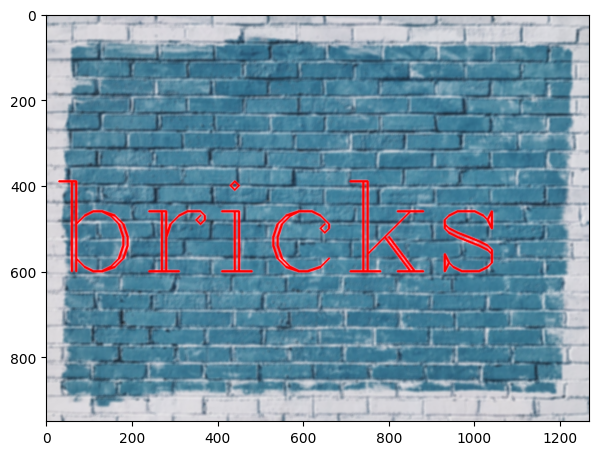

In [ ]:
display_img(blur)

## Great Work! Hopefully now you could imagine how software like PhotoShop or Google Images works!